**Контекст:** Цены на дома в Мельбурне

 **Источник данных:** https://www.kaggle.com/datasets/dansbecker/melbourne-housing-snapshot?resource=download

**Загрузка данных:**

In [53]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error

In [2]:
data = pd.read_csv('/content/drive/MyDrive/melb_data.csv')
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0
3,Abbotsford,40 Federation La,3,h,850000.0,PI,Biggin,4/03/2017,2.5,3067.0,...,2.0,1.0,94.0,NaN,NaN,Yarra,-37.7969,144.9969,Northern Metropolitan,4019.0
4,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,4/06/2016,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra,-37.8072,144.9941,Northern Metropolitan,4019.0


# **РАЗВЕДОЧНЫЙ АНАЛИЗ**

In [4]:
data.shape

(13580, 21)

*В исходном датасете 13580 объектов и 21 признак.*

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Price          13580 non-null  float64
 5   Method         13580 non-null  object 
 6   SellerG        13580 non-null  object 
 7   Date           13580 non-null  object 
 8   Distance       13580 non-null  float64
 9   Postcode       13580 non-null  float64
 10  Bedroom2       13580 non-null  float64
 11  Bathroom       13580 non-null  float64
 12  Car            13518 non-null  float64
 13  Landsize       13580 non-null  float64
 14  BuildingArea   7130 non-null   float64
 15  YearBuilt      8205 non-null   float64
 16  CouncilArea    12211 non-null  object 
 17  Lattitude      13580 non-null  float64
 18  Longti

*В датасете 13580 строк с данными, разделенными на 21 признак, 8 из которых категориальные (Dtype=object). Целевой признак - "Price".*

In [6]:
data.describe().T #общее описание датасета.

,count,mean,std,min,25%,50%,75%,max
Rooms,13580.0,2.937997e+00,0.955748,1.00000,2.000000,3.000000,3.000000e+00,1.000000e+01
Price,13580.0,1.075684e+06,639310.724296,85000.00000,650000.000000,903000.000000,1.330000e+06,9.000000e+06
Distance,13580.0,1.013778e+01,5.868725,0.00000,6.100000,9.200000,1.300000e+01,4.810000e+01
Postcode,13580.0,3.105302e+03,90.676964,3000.00000,3044.000000,3084.000000,3.148000e+03,3.977000e+03
Bedroom2,13580.0,2.914728e+00,0.965921,0.00000,2.000000,3.000000,3.000000e+00,2.000000e+01
Bathroom,13580.0,1.534242e+00,0.691712,0.00000,1.000000,1.000000,2.000000e+00,8.000000e+00
Car,13518.0,1.610075e+00,0.962634,0.00000,1.000000,2.000000,2.000000e+00,1.000000e+01
Landsize,13580.0,5.584161e+02,3990.669241,0.00000,177.000000,440.000000,6.510000e+02,4.330140e+05
BuildingArea,7130.0,1.519676e+02,541.014538,0.00000,93.000000,126.000000,1.740000e+02,4.451500e+04
YearBuilt,8205.0,1.964684e+03,37.273762,1196.00000,1940.000000,1970.000000,1.999000e+03,2.018000e+03


*Много пропусков в  признаках BuildingArea и YearBuilt.
Обращает на себя внимание минимальное значение года постройки дома - 1196г.- для города, основанного в 1835 году значение нереальное.
Среди значений признаков Количество ванных комнат (Bathroom) и Количество спален (Bedroom2) встречаются нули, что может означать либо дома низкого класса либо некорректные данные. Нули в признаке BuildingArea явно говорят о некорректных данных.*

*Чуть подробнее разведочный анализ позволит произвести pandas profiling.*

In [7]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     \ 17.9 MB 23.7 MB/s 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 119.1 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=399623 sha256=501258464d8fff66050527165d4b1ca5b20f2e910bc1be4eb635b4def544483b
  Stored in directory: /tmp/pip-ephem-wheel-cache-s33jf18m/wheels/85/5d/45/8a23c7b77d2023fbc37490b8902f7fdeff5614f65d6e08b6c4
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=4c8

In [ ]:
from pandas_profiling import ProfileReport
profile = ProfileReport(data, title = 'Pandas Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: >

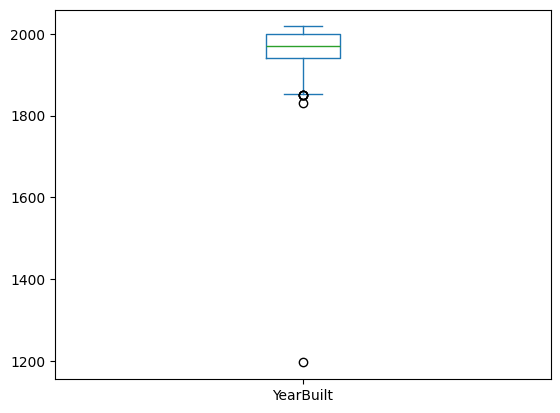

In [8]:
data['YearBuilt'].plot.box()#визуализация выбросов года постройки. Один дом построен в 1196, что явно не соответствует действительности.

Анализ отчета *pandas_profiling* говорит о том, что:




*   *Address*: число уникальных значений признака сопоставимо с общим числом строк в датасете, что может привести к переобучению модели. При этом в датасете содержатся другие признаки, определяющие местоположение дома - *Regionname* и *Distance*. Признак Address может быть удален.
*   *CouncilArea*: пропущено 10% данных, а также высокая степень корреляции с признаками Район (*Regionname*) и расстояние от центра города (*Distance*). Признаки *Regionname* и *Distance* не содержат пропусков и достаточно определяют местоположение  дома. Признак *CouncilArea* может быть удален.
*   *SellerG*: также высокое число уникальных значений. Признак может быть удален.
*   Date: высокое число уникальных значений. Признак может быть удален.
*   Признаки *Car, BuildingArea, YearBuilt* содержат пропуски данных.
*   Датасет содержит категориальные признаки, которые должны быть преобразованы в числовые значения.
*   Согласно корреляции Пирсона:

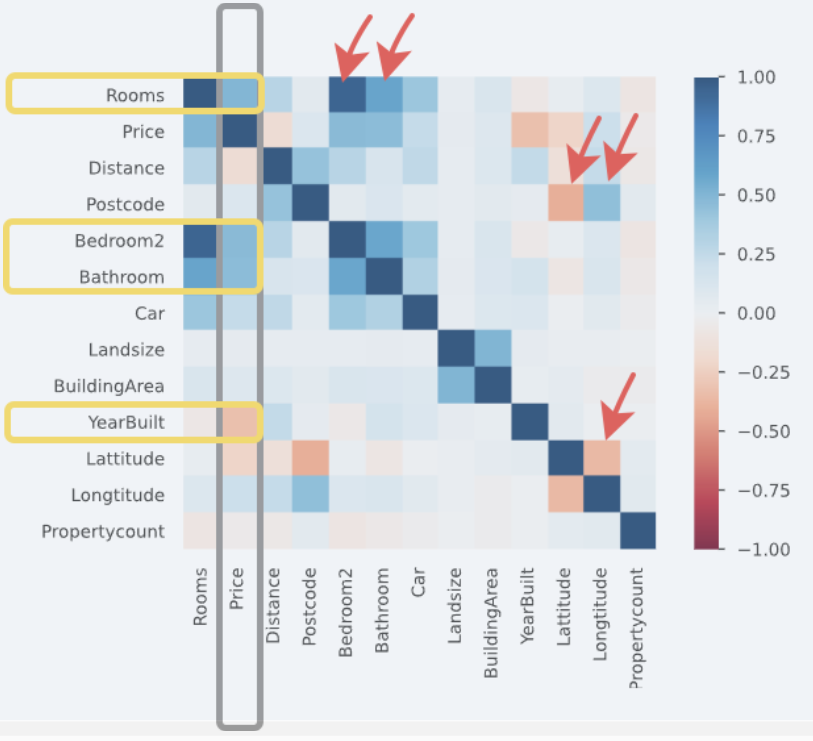

высокая степень корреляции целевого признака (*Price*) с такими признаками как *Rooms, Bedroom2 , Bathroom* и *YearBuilt*. При этом логично выглядит положительная корреляция цены дома (*Price*) с общим количеством комнат (*Rooms*), количеством спален (*Bedroom2*) и ванных комнат (*Bathroom*). Интересна отрицательная корреляция цены с годом постройки (*YearBuilt*). Чем старше дом, тем он дороже. При этом отмечается высокая степень корреляции года постройки с типом здания.
*   Так же отмечается отрицательная корреляция цены дома с расстоянием от центрального делового района (*Distance*), положительная с количеством мест для парковки (*Car*) и зависимость от широты и долготы нахождения объекта недвижимости. Логично.









---

Разведочный анализ показал необходимость проведения следующих этапов предобработки данных:
*   Удаление признаков *Address, Date, CouncilArea, SellerG*.
*   Заполнение пропусков в колонках *Car, BuildingArea, YearBuilt.*
*   Преобразование категориальных признаков *Suburb, Method* и *Regionname* в числовые.
*   Ограничение года постройки дома годом основания города - 1835г








---



In [9]:
ans = data['Price'] #выделение прогнозируемой переменной - цены дома
data = data.drop(columns=['Price']) #удаление прогнозируемой переменной из анализируемого датасета

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         13580 non-null  object 
 1   Address        13580 non-null  object 
 2   Rooms          13580 non-null  int64  
 3   Type           13580 non-null  object 
 4   Method         13580 non-null  object 
 5   SellerG        13580 non-null  object 
 6   Date           13580 non-null  object 
 7   Distance       13580 non-null  float64
 8   Postcode       13580 non-null  float64
 9   Bedroom2       13580 non-null  float64
 10  Bathroom       13580 non-null  float64
 11  Car            13518 non-null  float64
 12  Landsize       13580 non-null  float64
 13  BuildingArea   7130 non-null   float64
 14  YearBuilt      8205 non-null   float64
 15  CouncilArea    12211 non-null  object 
 16  Lattitude      13580 non-null  float64
 17  Longtitude     13580 non-null  float64
 18  Region

**Деление данных на train и test**

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(data, ans, test_size=0.2)# test_size — доля данных в тестовой выборке

*Проверка распределений признаков в выборках train и test:*

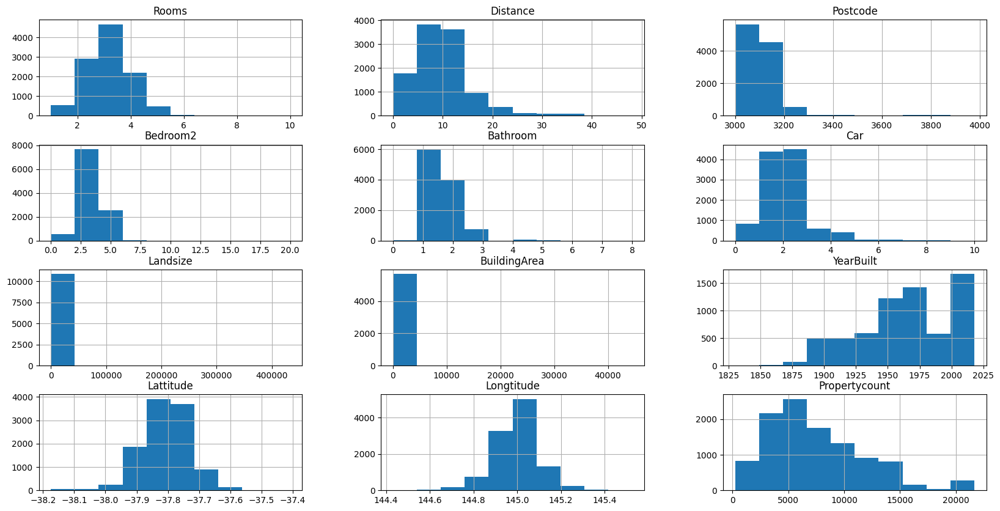

In [12]:
X_train.hist(figsize=(20, 10));

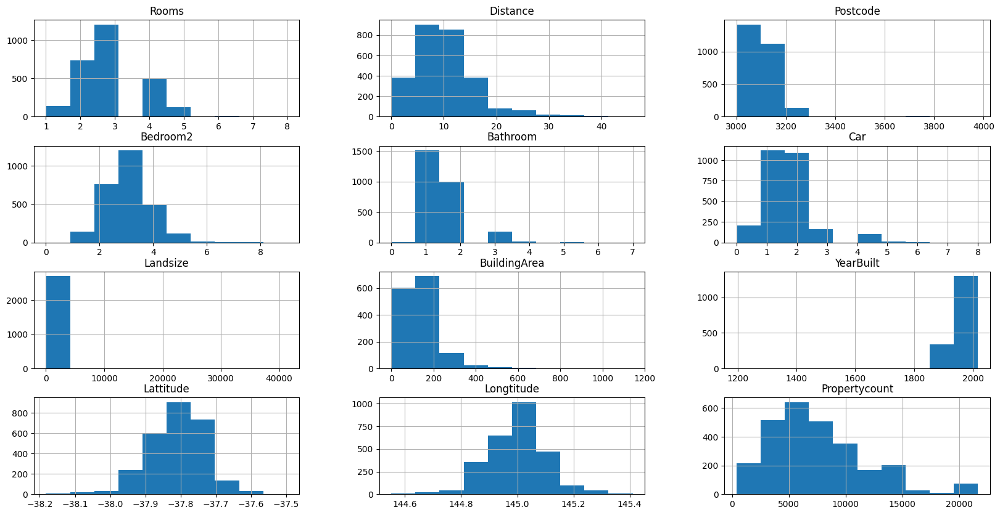

In [13]:
X_test.hist(figsize=(20,10));

*Распределение признаков в выборках одинаково.*

# **ПРЕДОБРАБОТКА TRAIN**

**Предобработка. Удаление признаков.**

*Признаки Address, Date, SellerG и CouncilArea не несут полезной для анализа информации - удаляются для предотвращения усложнения модели*

In [14]:
X_train = X_train.drop(columns = ['Address', 'Date', 'CouncilArea', 'SellerG'])

In [15]:
X_train.head()

,Suburb,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount
8938,Sandringham,2,u,S,15.2,3191.0,2.0,1.0,1.0,0.0,67.0,1970.0,-37.95236,145.00737,Southern Metropolitan,4497.0
12591,Reservoir,3,h,SP,12.0,3073.0,3.0,1.0,2.0,741.0,NaN,NaN,-37.70846,145.03039,Northern Metropolitan,21650.0
7619,Brunswick East,4,h,S,4.5,3057.0,4.0,1.0,2.0,449.0,159.0,1930.0,-37.76710,144.97620,Northern Metropolitan,5533.0
11437,Montmorency,3,t,S,16.2,3094.0,3.0,2.0,2.0,260.0,157.0,2010.0,-37.72394,145.12456,Eastern Metropolitan,3891.0
11140,North Melbourne,4,h,S,1.8,3051.0,4.0,2.0,1.0,137.0,NaN,NaN,-37.80072,144.94960,Northern Metropolitan,6821.0


**Предобработка. Пропуски.**

*Для заполнения пропусков в столбцах  используется метод библиотеки pandas filna(). Числовые признаки заполняются медианами по столбцам.*

In [16]:
X_train['Car'] = X_train['Car'].fillna(X_train['Car'].median())
X_train['BuildingArea'] = X_train['BuildingArea'].fillna(X_train['BuildingArea'].median())
X_train['YearBuilt'] = X_train['YearBuilt'].fillna(X_train['YearBuilt'].median())


In [17]:
X_train.isna().any() #проверка наличия пропусков

,0
Suburb,False
Rooms,False
Type,False
Method,False
Distance,False
Postcode,False
Bedroom2,False
Bathroom,False
Car,False
Landsize,False


In [18]:
X_train.head()

,Suburb,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount
8938,Sandringham,2,u,S,15.2,3191.0,2.0,1.0,1.0,0.0,67.0,1970.0,-37.95236,145.00737,Southern Metropolitan,4497.0
12591,Reservoir,3,h,SP,12.0,3073.0,3.0,1.0,2.0,741.0,126.0,1970.0,-37.70846,145.03039,Northern Metropolitan,21650.0
7619,Brunswick East,4,h,S,4.5,3057.0,4.0,1.0,2.0,449.0,159.0,1930.0,-37.76710,144.97620,Northern Metropolitan,5533.0
11437,Montmorency,3,t,S,16.2,3094.0,3.0,2.0,2.0,260.0,157.0,2010.0,-37.72394,145.12456,Eastern Metropolitan,3891.0
11140,North Melbourne,4,h,S,1.8,3051.0,4.0,2.0,1.0,137.0,126.0,1970.0,-37.80072,144.94960,Northern Metropolitan,6821.0


**Предобработка. Категориальные признаки.LabelEncoder**

In [19]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10864 entries, 8938 to 791
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         10864 non-null  object 
 1   Rooms          10864 non-null  int64  
 2   Type           10864 non-null  object 
 3   Method         10864 non-null  object 
 4   Distance       10864 non-null  float64
 5   Postcode       10864 non-null  float64
 6   Bedroom2       10864 non-null  float64
 7   Bathroom       10864 non-null  float64
 8   Car            10864 non-null  float64
 9   Landsize       10864 non-null  float64
 10  BuildingArea   10864 non-null  float64
 11  YearBuilt      10864 non-null  float64
 12  Lattitude      10864 non-null  float64
 13  Longtitude     10864 non-null  float64
 14  Regionname     10864 non-null  object 
 15  Propertycount  10864 non-null  float64
dtypes: float64(11), int64(1), object(4)
memory usage: 1.4+ MB


*Значения в столбцах Suburb и Method переводятся в числа, используя LabelEncoder из Sklearn.*

In [20]:
le = LabelEncoder()
le.fit(X_train['Suburb'])

LabelEncoder()

In [21]:
le.classes_ #уникальные значения в столбце Suburb

array(['Abbotsford', 'Aberfeldie', 'Airport West', 'Albanvale',
       'Albert Park', 'Albion', 'Alphington', 'Altona', 'Altona Meadows',
       'Altona North', 'Ardeer', 'Armadale', 'Ascot Vale', 'Ashburton',
       'Ashwood', 'Aspendale', 'Aspendale Gardens', 'Attwood',
       'Avondale Heights', 'Bacchus Marsh', 'Balaclava', 'Balwyn',
       'Balwyn North', 'Bayswater', 'Bayswater North', 'Beaconsfield',
       'Beaumaris', 'Bellfield', 'Bentleigh', 'Bentleigh East', 'Berwick',
       'Black Rock', 'Blackburn', 'Blackburn North', 'Blackburn South',
       'Bonbeach', 'Boronia', 'Box Hill', 'Braybrook', 'Briar Hill',
       'Brighton', 'Brighton East', 'Broadmeadows', 'Brookfield',
       'Brooklyn', 'Brunswick', 'Brunswick East', 'Brunswick West',
       'Bulleen', 'Bullengarook', 'Bundoora', 'Burnley', 'Burnside',
       'Burnside Heights', 'Burwood', 'Burwood East', 'Cairnlea',
       'Camberwell', 'Campbellfield', 'Canterbury', 'Carlton',
       'Carlton North', 'Carnegie', 'Caro

In [22]:
X_train['Suburb'] = le.transform(X_train['Suburb'])

In [23]:
X_train.head()

,Suburb,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount
8938,244,2,u,S,15.2,3191.0,2.0,1.0,1.0,0.0,67.0,1970.0,-37.95236,145.00737,Southern Metropolitan,4497.0
12591,233,3,h,SP,12.0,3073.0,3.0,1.0,2.0,741.0,126.0,1970.0,-37.70846,145.03039,Northern Metropolitan,21650.0
7619,46,4,h,S,4.5,3057.0,4.0,1.0,2.0,449.0,159.0,1930.0,-37.76710,144.97620,Northern Metropolitan,5533.0
11437,197,3,t,S,16.2,3094.0,3.0,2.0,2.0,260.0,157.0,2010.0,-37.72394,145.12456,Eastern Metropolitan,3891.0
11140,212,4,h,S,1.8,3051.0,4.0,2.0,1.0,137.0,126.0,1970.0,-37.80072,144.94960,Northern Metropolitan,6821.0


In [24]:
le.fit(X_train['Method'])

LabelEncoder()

In [25]:
le.classes_

array(['PI', 'S', 'SA', 'SP', 'VB'], dtype=object)

In [26]:
X_train['Method'] = le.transform(X_train['Method'])
X_train.head()

,Suburb,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Regionname,Propertycount
8938,244,2,u,1,15.2,3191.0,2.0,1.0,1.0,0.0,67.0,1970.0,-37.95236,145.00737,Southern Metropolitan,4497.0
12591,233,3,h,3,12.0,3073.0,3.0,1.0,2.0,741.0,126.0,1970.0,-37.70846,145.03039,Northern Metropolitan,21650.0
7619,46,4,h,1,4.5,3057.0,4.0,1.0,2.0,449.0,159.0,1930.0,-37.76710,144.97620,Northern Metropolitan,5533.0
11437,197,3,t,1,16.2,3094.0,3.0,2.0,2.0,260.0,157.0,2010.0,-37.72394,145.12456,Eastern Metropolitan,3891.0
11140,212,4,h,1,1.8,3051.0,4.0,2.0,1.0,137.0,126.0,1970.0,-37.80072,144.94960,Northern Metropolitan,6821.0


**Предобработка. Категориальные признаки. Бинаризация**

*Столбцы Regionname и Type содержат небольшое число уникальных значений, можно их преобразовать в числа с помощью бинаризации.*

In [27]:
data['Regionname'].unique()

array(['Northern Metropolitan', 'Western Metropolitan',
       'Southern Metropolitan', 'Eastern Metropolitan',
       'South-Eastern Metropolitan', 'Eastern Victoria',
       'Northern Victoria', 'Western Victoria'], dtype=object)

In [28]:
pd.get_dummies(X_train['Regionname'])

,Eastern Metropolitan,Eastern Victoria,Northern Metropolitan,Northern Victoria,South-Eastern Metropolitan,Southern Metropolitan,Western Metropolitan,Western Victoria
8938,False,False,False,False,False,True,False,False
12591,False,False,True,False,False,False,False,False
7619,False,False,True,False,False,False,False,False
11437,True,False,False,False,False,False,False,False
11140,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...
7153,False,False,False,False,False,True,False,False
10760,False,False,False,False,False,False,True,False
11123,True,False,False,False,False,False,False,False
6169,False,False,False,False,False,True,False,False


In [29]:
X_train = pd.get_dummies(X_train, columns=['Regionname'])

In [30]:
X_train.head()

,Suburb,Rooms,Type,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,...,Longtitude,Propertycount,Regionname_Eastern Metropolitan,Regionname_Eastern Victoria,Regionname_Northern Metropolitan,Regionname_Northern Victoria,Regionname_South-Eastern Metropolitan,Regionname_Southern Metropolitan,Regionname_Western Metropolitan,Regionname_Western Victoria
8938,244,2,u,1,15.2,3191.0,2.0,1.0,1.0,0.0,...,145.00737,4497.0,False,False,False,False,False,True,False,False
12591,233,3,h,3,12.0,3073.0,3.0,1.0,2.0,741.0,...,145.03039,21650.0,False,False,True,False,False,False,False,False
7619,46,4,h,1,4.5,3057.0,4.0,1.0,2.0,449.0,...,144.97620,5533.0,False,False,True,False,False,False,False,False
11437,197,3,t,1,16.2,3094.0,3.0,2.0,2.0,260.0,...,145.12456,3891.0,True,False,False,False,False,False,False,False
11140,212,4,h,1,1.8,3051.0,4.0,2.0,1.0,137.0,...,144.94960,6821.0,False,False,True,False,False,False,False,False


In [31]:
X_train = pd.get_dummies(X_train, columns=['Type'])

In [32]:
X_train.head()

,Suburb,Rooms,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,...,Regionname_Eastern Victoria,Regionname_Northern Metropolitan,Regionname_Northern Victoria,Regionname_South-Eastern Metropolitan,Regionname_Southern Metropolitan,Regionname_Western Metropolitan,Regionname_Western Victoria,Type_h,Type_t,Type_u
8938,244,2,1,15.2,3191.0,2.0,1.0,1.0,0.0,67.0,...,False,False,False,False,True,False,False,False,False,True
12591,233,3,3,12.0,3073.0,3.0,1.0,2.0,741.0,126.0,...,False,True,False,False,False,False,False,True,False,False
7619,46,4,1,4.5,3057.0,4.0,1.0,2.0,449.0,159.0,...,False,True,False,False,False,False,False,True,False,False
11437,197,3,1,16.2,3094.0,3.0,2.0,2.0,260.0,157.0,...,False,False,False,False,False,False,False,False,True,False
11140,212,4,1,1.8,3051.0,4.0,2.0,1.0,137.0,126.0,...,False,True,False,False,False,False,False,True,False,False


In [33]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10864 entries, 8938 to 791
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Suburb                                 10864 non-null  int64  
 1   Rooms                                  10864 non-null  int64  
 2   Method                                 10864 non-null  int64  
 3   Distance                               10864 non-null  float64
 4   Postcode                               10864 non-null  float64
 5   Bedroom2                               10864 non-null  float64
 6   Bathroom                               10864 non-null  float64
 7   Car                                    10864 non-null  float64
 8   Landsize                               10864 non-null  float64
 9   BuildingArea                           10864 non-null  float64
 10  YearBuilt                              10864 non-null  float64
 11  Lattit

В тренировочной выборке не осталось ни пропусков, ни категориальных признаков.

# **ОБУЧЕНИЕ МОДЕЛЕЙ. СЛУЧАЙНЫЙ ЛЕС**

**Случайный лес**

In [34]:
rf = RandomForestRegressor(n_estimators=100,max_depth=7)

In [35]:
rf.fit(X_train, Y_train)

RandomForestRegressor(max_depth=7)

**Градиентый бустинг**

In [36]:
gb = GradientBoostingRegressor(random_state=1234)
gb.fit(X_train, Y_train)

GradientBoostingRegressor(random_state=1234)

# **ПОДГОТОВКА ТЕСТОВЫХ ДАННЫХ**

In [37]:
X_test.head()

,Suburb,Address,Rooms,Type,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
11935,Carnegie,13/1150 Dandenong Rd,1,u,PI,Ray,29/07/2017,10.1,3163.0,1.0,1.0,1.0,1978.0,NaN,NaN,Glen Eira,-37.88506,145.06411,Southern Metropolitan,7822.0
5522,Seddon,28 Lily St,3,h,S,Nelson,28/08/2016,6.6,3011.0,3.0,2.0,1.0,229.0,NaN,NaN,Maribyrnong,-37.80320,144.88920,Western Metropolitan,2417.0
1461,Bulleen,42 Robert St,4,h,S,Jellis,3/09/2016,11.8,3105.0,4.0,1.0,2.0,717.0,180.0,1960.0,Manningham,-37.76080,145.08620,Eastern Metropolitan,4480.0
5511,Seddon,4 webster St,4,h,SP,Jas,19/11/2016,6.6,3011.0,4.0,2.0,3.0,571.0,198.0,1920.0,Maribyrnong,-37.80900,144.88650,Western Metropolitan,2417.0
6175,Surrey Hills,3/22 Scottsdale St,2,u,S,Noel,25/02/2017,11.2,3127.0,2.0,1.0,1.0,226.0,NaN,1980.0,Whitehorse,-37.83270,145.10190,Southern Metropolitan,5457.0


In [38]:
X_test['Car'] = X_test['Car'].fillna(X_train['Car'].median())
X_test['BuildingArea'] = X_test['BuildingArea'].fillna(X_train['BuildingArea'].median())
X_test['YearBuilt'] = X_test['YearBuilt'].fillna(X_train['YearBuilt'].median())

In [39]:
X_test['Method'] = le.transform(X_test['Method'])

In [40]:
le.fit(X_test['Suburb'])
X_test['Suburb'] = le.transform(X_test['Suburb'])

In [41]:
X_test.head()

,Suburb,Address,Rooms,Type,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
11935,53,13/1150 Dandenong Rd,1,u,0,Ray,29/07/2017,10.1,3163.0,1.0,1.0,1.0,1978.0,126.0,1970.0,Glen Eira,-37.88506,145.06411,Southern Metropolitan,7822.0
5522,217,28 Lily St,3,h,1,Nelson,28/08/2016,6.6,3011.0,3.0,2.0,1.0,229.0,126.0,1970.0,Maribyrnong,-37.80320,144.88920,Western Metropolitan,2417.0
1461,44,42 Robert St,4,h,1,Jellis,3/09/2016,11.8,3105.0,4.0,1.0,2.0,717.0,180.0,1960.0,Manningham,-37.76080,145.08620,Eastern Metropolitan,4480.0
5511,217,4 webster St,4,h,3,Jas,19/11/2016,6.6,3011.0,4.0,2.0,3.0,571.0,198.0,1920.0,Maribyrnong,-37.80900,144.88650,Western Metropolitan,2417.0
6175,234,3/22 Scottsdale St,2,u,1,Noel,25/02/2017,11.2,3127.0,2.0,1.0,1.0,226.0,126.0,1980.0,Whitehorse,-37.83270,145.10190,Southern Metropolitan,5457.0


In [42]:
X_test = pd.get_dummies(X_test, columns=['Regionname', 'Type'])

In [43]:
X_test = X_test.drop(columns = ['Address', 'Date', 'CouncilArea', 'SellerG'])

# **ПРЕДСКАЗАНИЕ НА ТЕСТОВОМ НАБОРЕ ДАННЫХ**

**Случайный лес**

In [44]:
y_predicted_rf = rf.predict(X_test)

In [45]:
y_predicted_rf[:10]

array([ 362523.84758516, 1068665.53152087, 1303248.60232603,
       1595032.10519989,  661726.78690366,  943749.02176389,
       1086745.93902046,  661726.78690366,  668879.43869907,
       1253218.13189898])

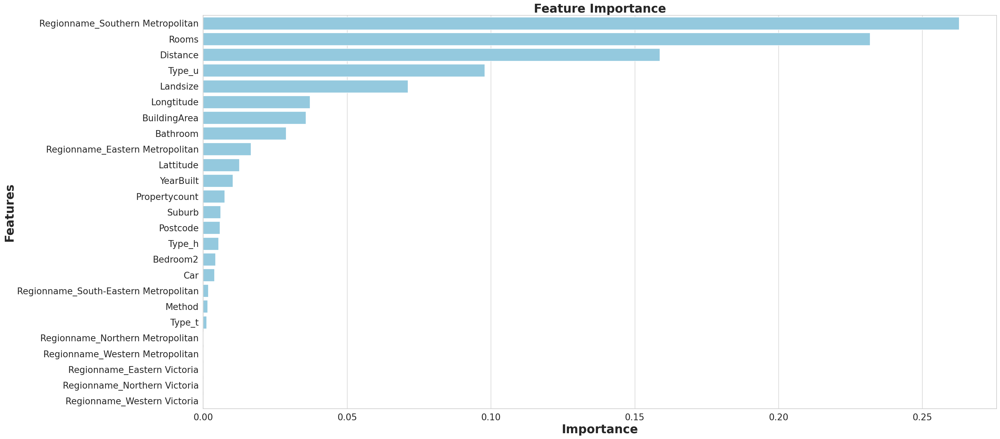

None

,Features,Gini-Importance
0,Regionname_Southern Metropolitan,0.262724
1,Rooms,0.231766
2,Distance,0.158711
3,Type_u,0.097821
4,Landsize,0.071096
5,Longtitude,0.037045
6,BuildingArea,0.035610
7,Bathroom,0.028824
8,Regionname_Eastern Metropolitan,0.016547
9,Lattitude,0.012483


In [46]:
feats = {}
for feature, importance in zip(X_train.columns, rf.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

*Согласно модели Случайного леса тройка самых важных признаков для прогнозирования цены дома:*

*   район,
*   количество комнат,
*   удаленность от делового центра.

**Градиентый бустинг**

In [47]:
y_predicted_gb = gb.predict(X_test)

In [48]:
y_predicted_gb[:10]

array([ 441696.07165173, 1044589.9396065 , 1337817.49918143,
       1564498.40627716,  607381.38243833,  796242.28124083,
       1096319.76565568,  557638.9567524 ,  794799.31127793,
       1255810.19006487])

**Тестовые значения**

In [49]:
np.array(Y_test)[:10]

array([ 316000., 1310000., 1300000., 1455000.,  899000.,  665000.,
       1408000.,  600000.,  665500., 1005000.])

# **Метрики качества**

**Случайный лес**

In [51]:
print('Точность Random Forest Regressor: ')
crossl = cross_val_score(estimator = rf, X = X_train, y = Y_train, cv = 4,verbose = 0)
msel = mean_squared_error(Y_test, y_predicted_rf)
rmsel = mean_squared_error(Y_test, y_predicted_rf)**0.5
mael = mean_absolute_error(Y_test, y_predicted_rf)
r2l = r2_score(Y_test, y_predicted_rf)

print('Cross val     : ',crossl)
print('R2            : ', r2l)
print('MAE           : ', mael)
print('MSE (RMSE)    : ', msel,' (',rmsel,')')

Точность Random Forest Regressor: 
Cross val     :  [0.69380133 0.76329922 0.73873174 0.72842292]
R2            :  0.7550847673630643
MAE           :  195048.7073329423
MSE (RMSE)    :  87344064798.92519  ( 295540.2930209774 )


**Градиентый бустинг**

In [52]:
print('Точность Gradient Boosting Regressor: ')
crossr = cross_val_score(estimator = gb, X = X_train, y = Y_train, cv = 4,verbose = 0)
mser = mean_squared_error(Y_test, y_predicted_gb)
rmser = mean_squared_error(Y_test, y_predicted_gb)**0.5
maer = mean_absolute_error(Y_test, y_predicted_gb)
r2r = r2_score(Y_test, y_predicted_gb)

print('Cross val     : ',crossr)
print('R2            : ', r2r)
print('MAE           : ', maer)
print('MSE (RMSE)    : ', mser,' (',rmser,')')

Точность Gradient Boosting Regressor: 
Cross val     :  [0.73846636 0.77999566 0.76875925 0.77225483]
R2            :  0.7944552972945601
MAE           :  177315.6224919123
MSE (RMSE)    :  73303361489.13036  ( 270745.9353141435 )
